# **New York City Taxi Fare Prediction**

Dataset:
https://www.kaggle.com/competitions/new-york-city-taxi-fare-prediction

### Imports

Import all necessary libraries.

In [258]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore', category = RuntimeWarning)
palette = sns.color_palette('Paired', 10)

## Reading data and first inspections

The dataset consists of 55M records, which is too big for loading into the memory at once. The records are randomly sorted by date, so we can work with the first 5M records and keep the sample mixed. We can also drop the 'key' column, as it is only a unique identifier and does not contain any useful information for us.

In [259]:
df_train = pd.read_csv("train.csv", nrows = 5000000, parse_dates = ['pickup_datetime']).drop(columns = 'key')

Inspect the first few records.

In [260]:
df_train.head(20)

,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,4.5,2009-06-15 17:26:21+00:00,-73.844311,40.721319,-73.841610,40.712278,1
1,16.9,2010-01-05 16:52:16+00:00,-74.016048,40.711303,-73.979268,40.782004,1
2,5.7,2011-08-18 00:35:00+00:00,-73.982738,40.761270,-73.991242,40.750562,2
3,7.7,2012-04-21 04:30:42+00:00,-73.987130,40.733143,-73.991567,40.758092,1
4,5.3,2010-03-09 07:51:00+00:00,-73.968095,40.768008,-73.956655,40.783762,1
5,12.1,2011-01-06 09:50:45+00:00,-74.000964,40.731630,-73.972892,40.758233,1
6,7.5,2012-11-20 20:35:00+00:00,-73.980002,40.751662,-73.973802,40.764842,1
7,16.5,2012-01-04 17:22:00+00:00,-73.951300,40.774138,-73.990095,40.751048,1
8,9.0,2012-12-03 13:10:00+00:00,-74.006462,40.726713,-73.993078,40.731628,1
9,8.9,2009-09-02 01:11:00+00:00,-73.980658,40.733873,-73.991540,40.758138,2


Check the statistics of the dataset to get an overview of the possible issues.

In [261]:
df_train.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
count,5.000000e+06,5.000000e+06,5.000000e+06,4.999964e+06,4.999964e+06,5.000000e+06
mean,1.134080e+01,-7.250678e+01,3.991974e+01,-7.250652e+01,3.991725e+01,1.684695e+00
std,9.820175e+00,1.280970e+01,8.963509e+00,1.284777e+01,9.486767e+00,1.331854e+00
min,-1.000000e+02,-3.426609e+03,-3.488080e+03,-3.412653e+03,-3.488080e+03,0.000000e+00
25%,6.000000e+00,-7.399206e+01,4.073491e+01,-7.399139e+01,4.073404e+01,1.000000e+00
50%,8.500000e+00,-7.398181e+01,4.075263e+01,-7.398016e+01,4.075315e+01,1.000000e+00
75%,1.250000e+01,-7.396711e+01,4.076711e+01,-7.396367e+01,4.076811e+01,2.000000e+00
max,1.273310e+03,3.439426e+03,3.310364e+03,3.457622e+03,3.345917e+03,2.080000e+02


We can see that almost every column has data which is not appropriate. In the next section I will clean the dataset.

## Data cleaning

Drop the Nas.

In [262]:
print(f'Number of records before removing: {df_train.shape}')
df_train = df_train.dropna()
print(f'Number of records after removing: {df_train.shape}')

Number of records before removing: (5000000, 7)
Number of records after removing: (4999964, 7)


Start with the target variable. Determine the minimum and maximum fare.

In [263]:
df_train.sort_values('fare_amount', inplace=True)
df_train.head(10)

,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
4083929,-100.00,2015-01-29 20:29:59+00:00,0.000000,0.000000,0.000000,0.000000,2
1245992,-62.00,2015-03-27 22:50:22+00:00,-74.002838,40.734230,-74.002548,40.734066,1
3848799,-60.00,2015-03-16 02:24:18+00:00,-74.040039,40.758389,-74.040047,40.758389,6
4470814,-57.33,2015-02-02 11:22:11+00:00,-73.971931,40.750149,-73.971947,40.750057,4
2549777,-53.69,2015-03-25 23:56:00+00:00,0.000000,0.000000,-73.793404,40.656551,1
1507225,-52.00,2015-01-23 10:13:51+00:00,0.000000,0.000000,0.000000,0.000000,1
1722272,-52.00,2015-06-08 14:42:50+00:00,-73.992683,40.757755,-73.992958,40.757812,1
2636195,-50.00,2015-03-25 20:51:43+00:00,-73.975166,40.752892,-73.976097,40.751339,1
1054606,-45.00,2010-02-10 10:32:10+00:00,-73.980128,40.745807,-73.980535,40.745232,1
3448419,-45.00,2010-03-29 18:16:10+00:00,-73.983423,40.744220,-73.974643,40.733368,2


Remove the negative and zero fares.

In [264]:
print(f'Number of records before removing: {df_train.shape}')
df_train = df_train[df_train.fare_amount>0]
print(f'Number of records after removing: {df_train.shape}')

Number of records before removing: (4999964, 7)
Number of records after removing: (4999621, 7)


Determine the minimum fare by plotting it from 0 to 10.

Text(0.5, 1.0, 'Distribution of Fare')

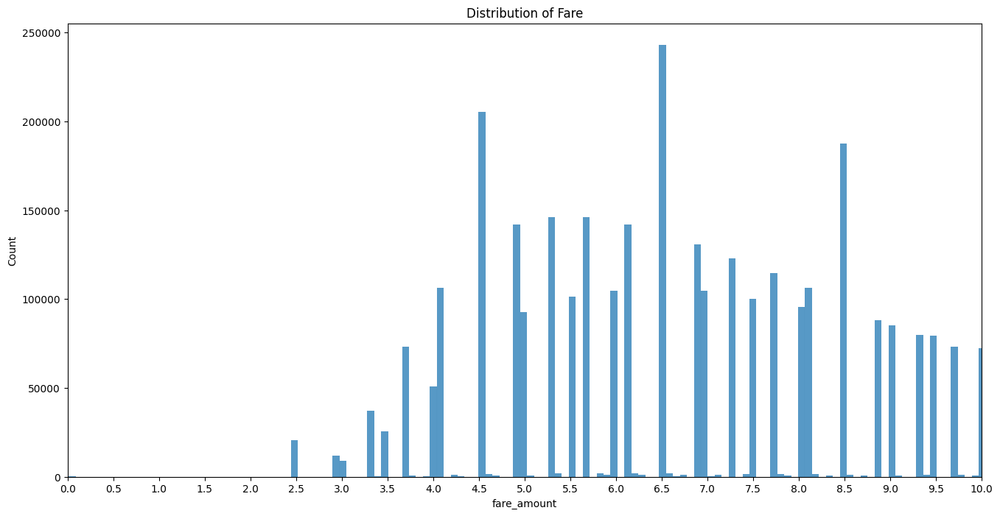

In [265]:
plt.figure(figsize = (16, 8))
sns.histplot(df_train['fare_amount'])
plt.xlim(left=0, right=10)
plt.xticks(np.arange(0, 10.5, 0.5))
plt.ylim(bottom=0)
plt.title('Distribution of Fare')

It seems like the minimum fare is 2.5 USD, drop the records where the fare is lower.

In [266]:
print(f'Number of records before removing: {df_train.shape}')
df_train = df_train[df_train.fare_amount>=2.5]
print(f'Number of records after removing: {df_train.shape}')

Number of records before removing: (4999621, 7)
Number of records after removing: (4999554, 7)


Determine a maximum value for fare which are considered outliers. Do it similarly to the determination of the minimum.

Text(0.5, 1.0, 'Distribution of Fare')

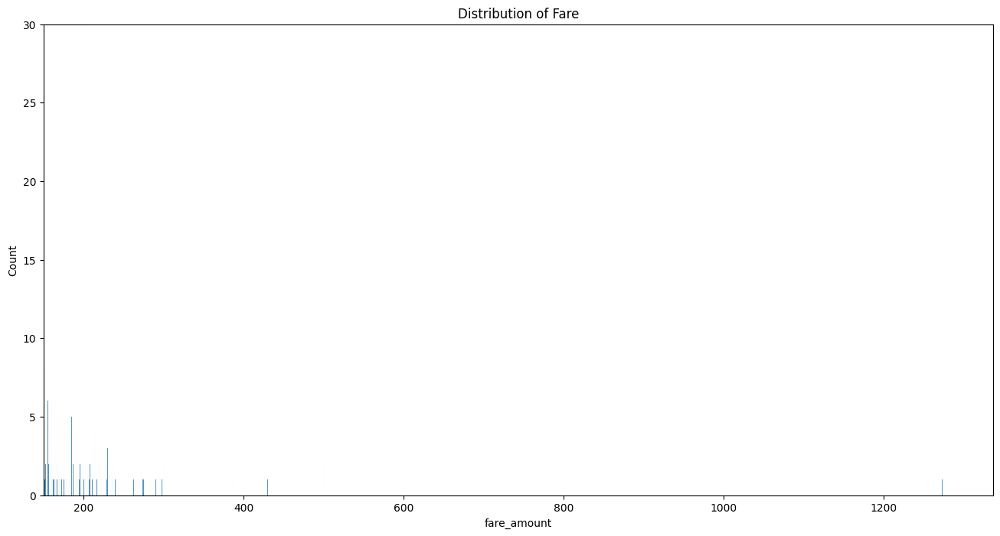

In [267]:
plt.figure(figsize = (16, 8))
sns.histplot(df_train['fare_amount'])
plt.xlim(left=150)
plt.ylim(bottom=0, top=30)
plt.title('Distribution of Fare')

I decided to remove values higher than 300 USD.

In [268]:
print(f'Number of records before removing: {df_train.shape}')
df_train = df_train[df_train.fare_amount<=300]
print(f'Number of records after removing: {df_train.shape}')

Number of records before removing: (4999554, 7)
Number of records after removing: (4999529, 7)


Plot the fare distribution between 0 and 100 on a histogram. There are fare values higher than 100 USD, but they would distort the histogram and make it less informative.

Text(0.5, 1.0, 'Distribution of Fare')

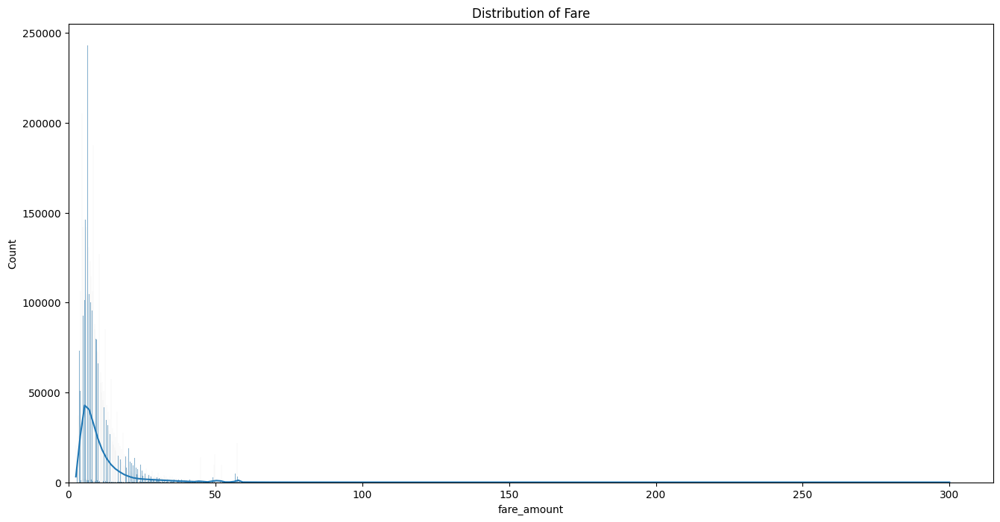

In [269]:
plt.figure(figsize = (16, 8))
sns.histplot(df_train['fare_amount'], kde=True)
plt.xlim(left=0)
plt.ylim(bottom=0)
plt.title('Distribution of Fare')

Create a binned version of the fare, which divides the variable into a number of bins.

Text(0.5, 1.0, 'Fare Binned')

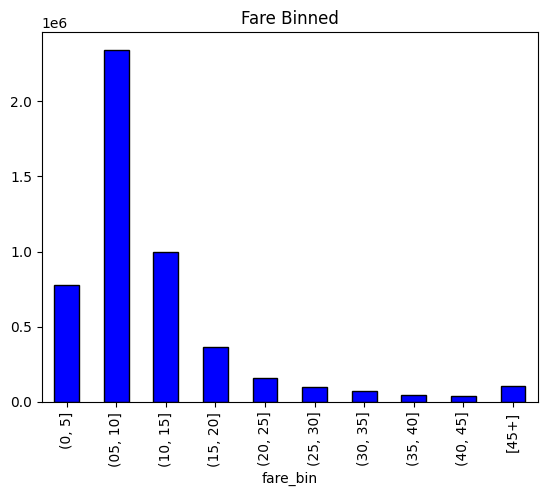

In [270]:
df_train['fare_bin'] = pd.cut(df_train['fare_amount'], bins = list(range(0, 50, 5))).astype(str)

df_train.loc[df_train['fare_bin'] == 'nan', 'fare_bin'] = '[45+]'

df_train.loc[df_train['fare_bin'] == '(5, 10]', 'fare_bin'] = '(05, 10]'

df_train['fare_bin'].value_counts().sort_index().plot.bar(color = 'b', edgecolor = 'k')
plt.title('Fare Binned')

The latitude of NYC is approximately between 40.5 and 40.9 and the longitude is between -74.3 and -73.7. Remove the datas which exceeds these limits.

In [271]:
print(f'Number of records before removing: {df_train.shape}')
df_train = df_train[(df_train['pickup_latitude'].between(40.5, 40.9)) & 
                    (df_train['pickup_longitude'].between(-74.3, -73.7)) & 
                    (df_train['dropoff_latitude'].between(40.5, 40.9)) & 
                    (df_train['dropoff_longitude'].between(-74.3, -73.7))]
print(f'Number of records after removing: {df_train.shape}')

Number of records before removing: (4999529, 8)
Number of records after removing: (4886760, 8)


Plot these locations on two simple charts. 

Text(0.5, 1.0, 'Dropoff Locations')

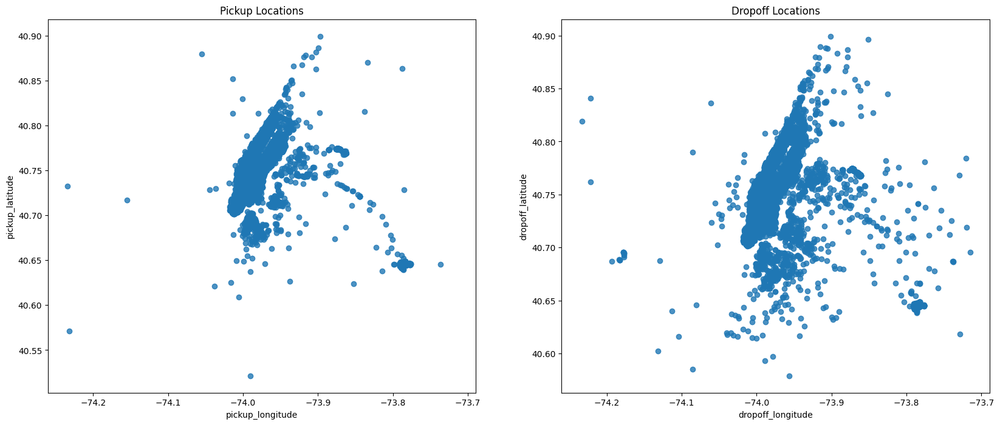

In [272]:
fig, axes = plt.subplots(1, 2, figsize = (20, 8), sharex=True, sharey=False)
axes = axes.flatten()

sns.regplot(x='pickup_longitude', y='pickup_latitude', fit_reg = False, 
            data = df_train.sample(10000), ax = axes[0])
sns.regplot(x='dropoff_longitude', y='dropoff_latitude', fit_reg = False, 
            data = df_train.sample(10000), ax = axes[1])
axes[0].set_title('Pickup Locations')
axes[1].set_title('Dropoff Locations')

For further visualization plot these locations on an interactive map.

In [273]:
# Create a map centered at an initial location
m = folium.Map(location=[40.8, -73.9], zoom_start=11)

# Sample data
df_sample = df_train.sample(10000)

# Add pickup locations to the map
for index, row in df_sample.iterrows():
    folium.CircleMarker(location=(row["pickup_latitude"], row["pickup_longitude"]),
                        radius=3,
                        color="blue",
                        fill=True,
                        fill_color="blue",
                        fill_opacity=0.6,
                        ).add_to(m)

# Add dropoff locations to the map
for index, row in df_sample.iterrows():
    folium.CircleMarker(location=(row["dropoff_latitude"], row["dropoff_longitude"]),
                        radius=3,
                        color="red",
                        fill=True,
                        fill_color="red",
                        fill_opacity=0.6,
                        ).add_to(m)

# Display the map
m

Remove records where the number of passengers is less than 1 or more than 6.

In [274]:
print(f'Number of records before removing: {df_train.shape}')
df_train = df_train[df_train['passenger_count'].between(1, 6)]
print(f'Number of records after removing: {df_train.shape}')

Number of records before removing: (4886760, 8)


Number of records after removing: (4869556, 8)


Now all columns have been cleaned.

## Correlation Analysis

### Distance

I assume that there might be a correlation between the travelling distance and the fare. We can calculate the distance between two points given their latitude and longitude using the Haversine formula. The Haversine formula is commonly used to compute the great-circle distance between two points on the surface of a sphere, which is a good approximation for short distances on the Earth. The formula is the following:
$$ d = 2R \cdot \arcsin\left(\sqrt{\sin^2\left(\frac{\text{lat}_2 - \text{lat}_1}{2}\right) + \cos(\text{lat}_1) \cdot \cos(\text{lat}_2) \cdot \sin^2\left(\frac{\text{lon}_2 - \text{lon}_1}{2}\right)}\right) $$
Let's define the function to calculate the distance between two points!

In [275]:
def haversine_distance(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2) ** 2
    c = 2 * np.arcsin(np.sqrt(a))
    
    earth_radius = 6371.0
    
    distance = earth_radius * c

    return distance

Add the distance column to the dataset.

In [276]:
df_train['distance'] = haversine_distance(df_train['pickup_latitude'], df_train['pickup_longitude'], df_train['dropoff_latitude'], df_train['dropoff_longitude'])

In [277]:
df_train.sort_values('distance', inplace=True)
df_train.head()

,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,fare_bin,distance
4476349,300.0,2014-05-24 17:51:00+00:00,-73.985117,40.753667,-73.985117,40.753667,2,[45+],0.0
4989461,7.0,2014-09-09 14:20:51+00:00,-73.906968,40.752370,-73.906968,40.752370,3,"(05, 10]",0.0
4127655,7.0,2014-11-20 16:44:00+00:00,-73.987817,40.722587,-73.987817,40.722587,5,"(05, 10]",0.0
1835807,7.0,2012-11-23 11:56:00+00:00,-73.946657,40.775855,-73.946657,40.775855,1,"(05, 10]",0.0
4317787,7.0,2014-06-27 09:50:00+00:00,-73.971102,40.760040,-73.971102,40.760040,1,"(05, 10]",0.0


We can see that there are records where the distance is zero. These rows should be removed.

In [278]:
df_train = df_train[df_train.distance>0]

Let's analyze the correlation between the distance and the fare.

In [279]:
df_train.groupby('fare_bin')['distance'].agg(['mean', 'count'])

,mean,count
fare_bin,,
"(0, 5]",0.712109,740453
"(05, 10]",1.471767,2266469
"(10, 15]",2.632100,967121
"(15, 20]",3.902993,355353
"(20, 25]",5.572492,153810
"(25, 30]",8.724834,95937
"(30, 35]",10.924278,70464
"(35, 40]",12.208201,40783
"(40, 45]",15.171386,32770


Text(0, 0.5, 'Mean Haversine Distance')

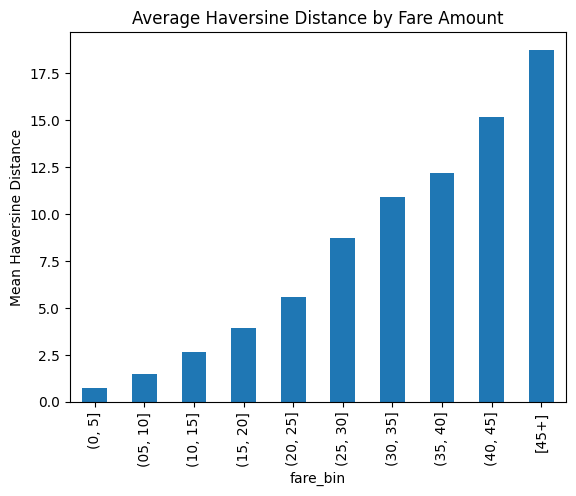

In [280]:
df_train.groupby('fare_bin')['distance'].mean().sort_index().plot.bar()
plt.title('Average Haversine Distance by Fare Amount')
plt.ylabel('Mean Haversine Distance')

It seems like there is a clear positive linear relationship between the fare and the distance of a trip. 

### Number of passengers

Use the kernel density estimate plot to visualize the distribution.

Text(0.5, 1.0, 'Distribution of Fare Amount by Number of Passengers')

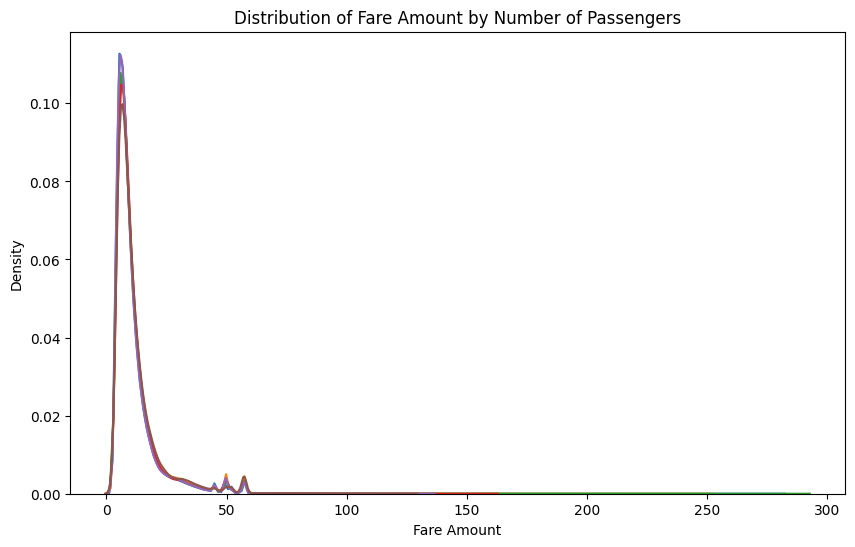

In [281]:
plt.figure(figsize = (10, 6))

for p, grouped in df_train.groupby('passenger_count'):
    sns.kdeplot(grouped['fare_amount'], label = f'{p} passengers')
    
plt.xlabel('Fare Amount')
plt.ylabel('Density')
plt.title('Distribution of Fare Amount by Number of Passengers')

There does not seem to be any difference between the number of passengers. For further visualization, calculate the average fare for every passenger count and display it on a bar chart.

In [282]:
df_train.groupby('passenger_count')['fare_amount'].agg(['mean', 'count'])

,mean,count
passenger_count,,
1,11.139963,3343843
2,11.764573,715930
3,11.535650,212452
4,11.728412,102761
5,11.205197,341634
6,12.154622,102633


Text(0.5, 1.0, 'Average Fare by Passenger Count')

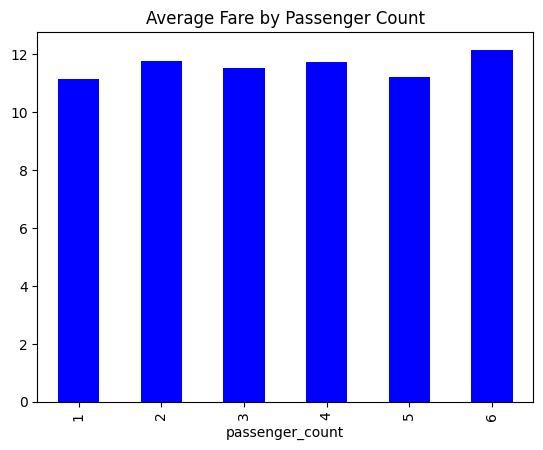

In [283]:
df_train.groupby('passenger_count')['fare_amount'].mean().plot.bar(color = 'b')
plt.title('Average Fare by Passenger Count')

There isn't any noticable correlation between the number of passengers and the fare.

### Time

In [284]:
df_train['pickup_datetime'] = pd.to_datetime(df_train['pickup_datetime'])
df_train['pickup_hour'] = df_train['pickup_datetime'].dt.hour
df_train['day'] = df_train['pickup_datetime'].dt.day_name()
# Create a dictionary to map days of the week to numbers
days_to_numbers = {
    'Monday': 1,
    'Tuesday': 2,
    'Wednesday': 3,
    'Thursday': 4,
    'Friday': 5,
    'Saturday': 6,
    'Sunday': 7
}

# Replace the days of the week with numbers in the 'day_of_week' column
df_train['day'] = df_train['day'].replace(days_to_numbers)

Text(0.5, 1.0, 'Average Fare by pickup_hour')

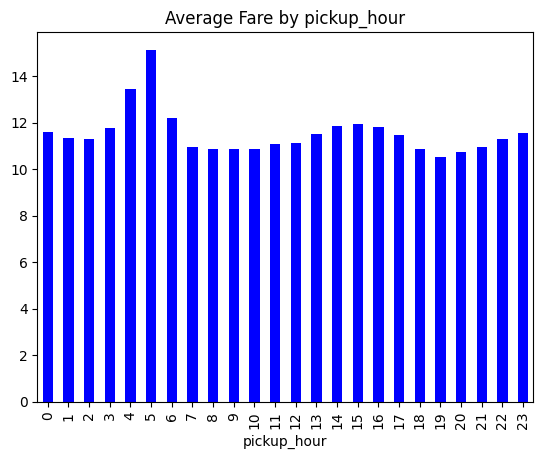

In [285]:
df_train.groupby('pickup_hour')['fare_amount'].agg(['mean', 'count'])
df_train.groupby('pickup_hour')['fare_amount'].mean().plot.bar(color = 'b')
plt.title('Average Fare by pickup_hour')

This column might be worth to implement into the model.

Text(0.5, 1.0, 'Average Fare by day')

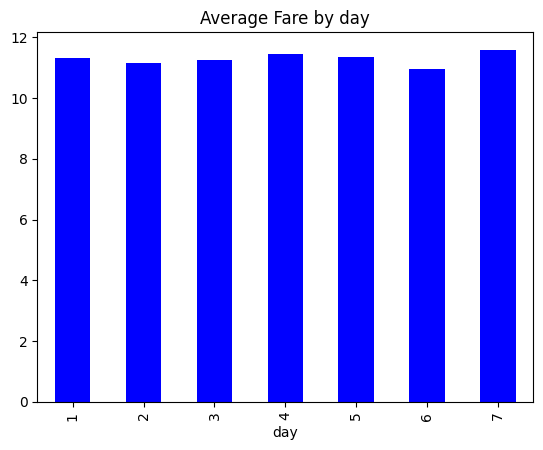

In [286]:
df_train.groupby('day')['fare_amount'].agg(['mean', 'count'])
df_train.groupby('day')['fare_amount'].mean().plot.bar(color = 'b')
plt.title('Average Fare by day')

It seems like there is no correlation between these two colums.

### Inflation

As the dataset contains records from 2009 to 2015, it might be worth to check if the inflation has an effect on the fare.

Text(0.5, 1.0, 'Average Fare by year')

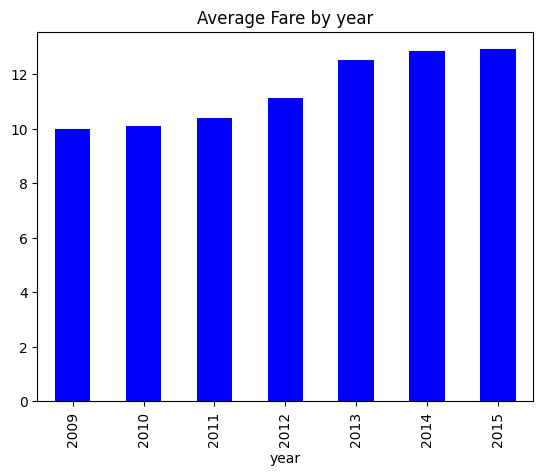

In [287]:
df_train['year'] = df_train['pickup_datetime'].dt.year
df_train.groupby('year')['fare_amount'].agg(['mean', 'count'])
df_train.groupby('year')['fare_amount'].mean().plot.bar(color = 'b')
plt.title('Average Fare by year')

The inflation clearly has an effect on the fare. Let's plot the correlations on a heatmap.

<Axes: >

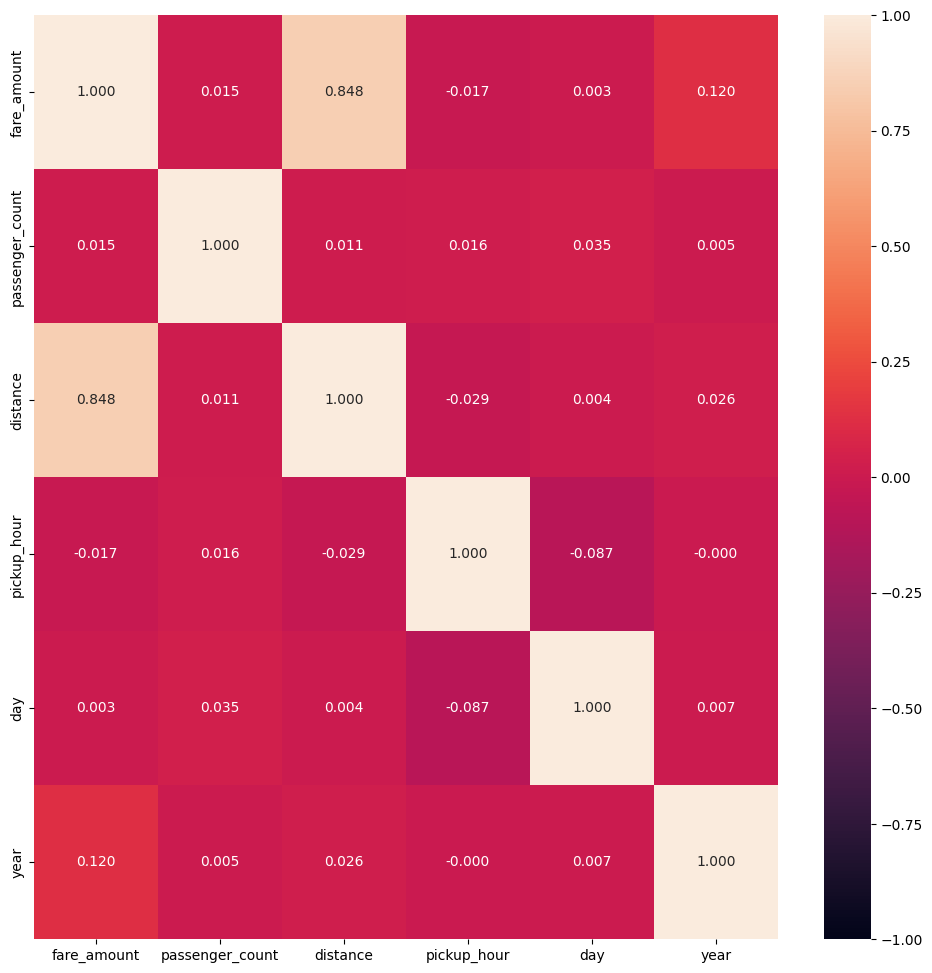

In [288]:
df_train_excluded = df_train.drop(columns=['pickup_datetime', 'fare_bin', 'pickup_latitude', 
                                           'pickup_longitude', 'dropoff_latitude', 'dropoff_longitude'])
corrs = df_train_excluded.corr()

plt.figure(figsize = (12, 12))
sns.heatmap(corrs, annot = True, vmin = -1, vmax = 1, fmt = '.3f')

According to the heatmap I will train the model with the 'distance', 'year' and 'pickup_hour' columns.

## Linear Regression

Create a basic linear regression model only including the driving distance.

In [289]:
X_train, X_valid, y_train, y_valid = train_test_split(df_train, np.array(df_train['fare_amount']), 
                                                      stratify = df_train['fare_bin'],
                                                      random_state = 1000, test_size = 1_000_000)

In [290]:
def metrics(train_pred, valid_pred, y_train, y_valid):
    """Calculate metrics:
       Root mean squared error and mean absolute percentage error"""
    
    # Root mean squared error
    train_rmse = np.sqrt(mean_squared_error(y_train, train_pred))
    valid_rmse = np.sqrt(mean_squared_error(y_valid, valid_pred))
    
    # Calculate absolute percentage error
    train_ape = abs((y_train - train_pred) / y_train)
    valid_ape = abs((y_valid - valid_pred) / y_valid)
    
    # Account for y values of 0
    train_ape[train_ape == np.inf] = 0
    train_ape[train_ape == -np.inf] = 0
    valid_ape[valid_ape == np.inf] = 0
    valid_ape[valid_ape == -np.inf] = 0
    
    train_mape = 100 * np.mean(train_ape)
    valid_mape = 100 * np.mean(valid_ape)
    
    return train_rmse, valid_rmse, train_mape, valid_mape
def evaluate(model, features, X_train, X_valid, y_train, y_valid):
    """Mean absolute percentage error"""
    
    # Make predictions
    train_pred = model.predict(X_train[features])
    valid_pred = model.predict(X_valid[features])
    
    # Get metrics
    train_rmse, valid_rmse, train_mape, valid_mape = metrics(train_pred, valid_pred,
                                                             y_train, y_valid)
    
    print(f'Training:   rmse = {round(train_rmse, 2)} \t mape = {round(train_mape, 2)}') # type: ignore
    print(f'Validation: rmse = {round(valid_rmse, 2)} \t mape = {round(valid_mape, 2)}') # type: ignore

Create a baseline for comparison.

In [291]:
train_mean = y_train.mean()

# Create list of the same prediction for every observation
train_preds = [train_mean for _ in range(len(y_train))]
valid_preds = [train_mean for _ in range(len(y_valid))]

tr, vr, tm, vm = metrics(train_preds, valid_preds, y_train, y_valid)

print(f'Baseline Training:   rmse = {round(tr, 2)} \t mape = {round(tm, 2)}') # type: ignore
print(f'Baseline Validation: rmse = {round(vr, 2)} \t mape = {round(vm, 2)}') # type: ignore

Baseline Training:   rmse = 9.39 	 mape = 64.53
Baseline Validation: rmse = 9.38 	 mape = 64.49


In [292]:
lr = LinearRegression()
lr.fit(X_train[['distance', 'pickup_hour', 'year']], y_train)

LinearRegression()

In [293]:
evaluate(lr, ['distance', 'pickup_hour', 'year'], X_train, X_valid, y_train, y_valid)

Training:   rmse = 4.88 	 mape = 30.18
Validation: rmse = 4.9 	 mape = 30.15


It might be interesting to check the results if we use all columns for training the model.

In [294]:
lr.fit(X_train[['distance', 'passenger_count', 'pickup_hour', 'year', 'day']], y_train)

LinearRegression()

In [295]:
evaluate(lr, ['distance', 'passenger_count', 'pickup_hour', 'year', 'day'], X_train, X_valid, y_train, y_valid)

Training:   rmse = 4.88 	 mape = 30.17
Validation: rmse = 4.9 	 mape = 30.14


## Summary

* We managed to reduce the rmse and mape by half compared to the mean.
* For further optimalization, we could engineer more features, perform feature selection or try different machine learning models. 
* It seems like we found two great correlations, the travelling distance and inflation.
* We could improve the model by paying more attention to the data cleaning as well. Notice that there are destinations on the map which are in water, obviously these are false datas, but are hard to remove from the dataset.
* We could add more plots for further visualization.